In [156]:
from h5glance import H5Glance

import os
import sys
import h5py
import math
import glob
import numpy  as np
import pandas as pd

from scipy    import stats
from datetime import datetime, timezone

from lgdo import LH5Store #If this fails, try pip install legend-pydataobj
import lgdo.lh5_store as lh5

import matplotlib.pyplot as plt

from legendmeta import LegendMetadata
#from pygama.flow import DataLoader

from scipy import stats as st

from collections import namedtuple

In [35]:
plt.rcParams["figure.figsize"] = 8, 5
plt.rcParams["font.size"]      = 12

In [112]:
def get_data_path(period=6, run=6, data_type='raw', data_mode='tst'):
    return f'/pscratch/sd/r/romo/legend_data/l200/tier/{data_type}/{data_mode}/p0{period}/r00{run}/'

In [113]:
wf_file = get_data_path(run=8, data_type='raw') + 'l200-p06-r008-tst-20230729T052313Z.lh5'

## Take a look at the waveforms

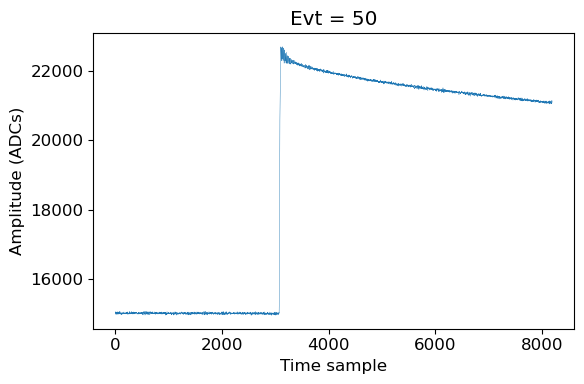

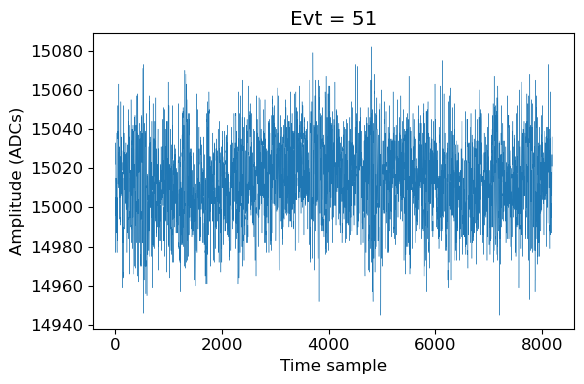

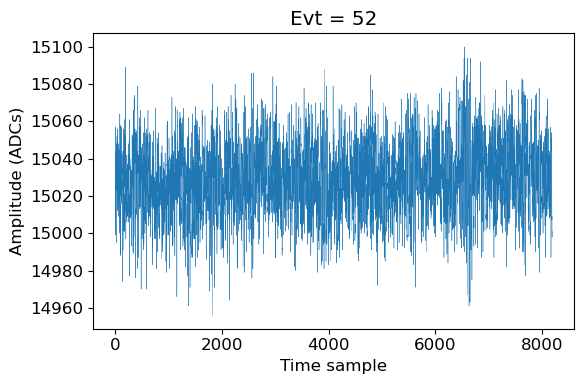

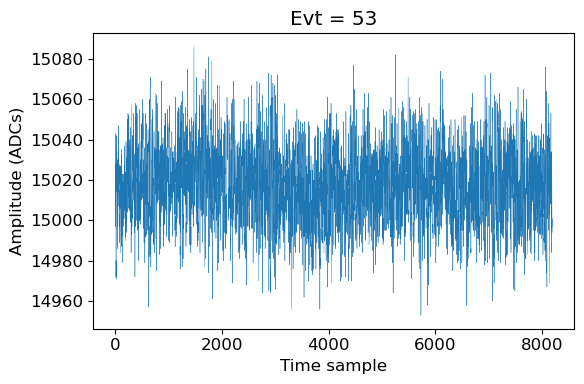

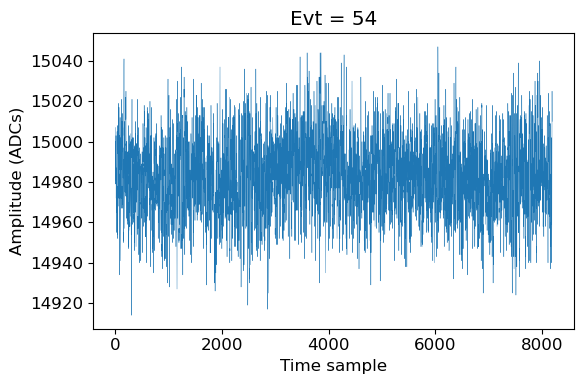

...

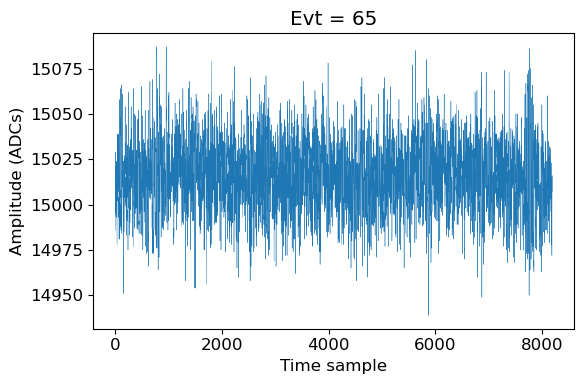

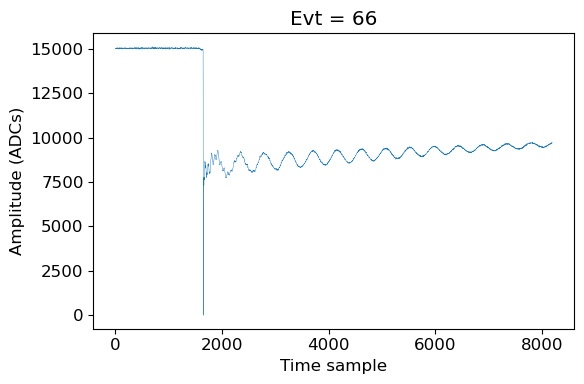

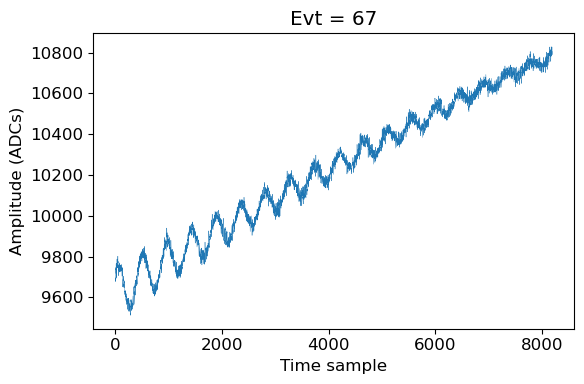

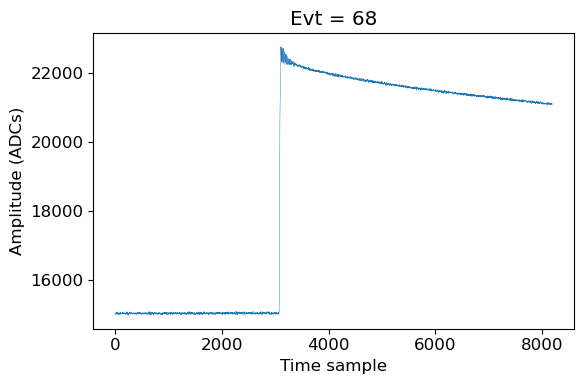

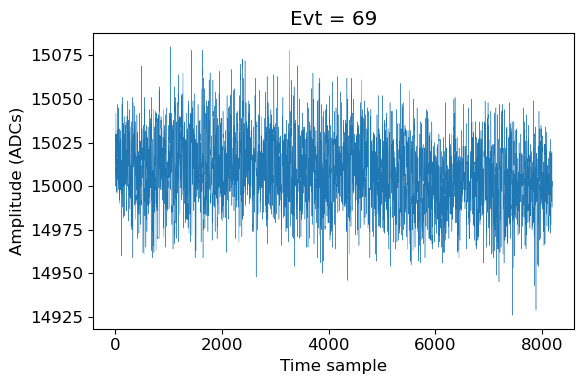

In [84]:
channel = 'ch1104000'
store   = LH5Store()
data_raw, n_tot = store.read_object(f'{channel}/raw/waveform', wf_file, n_rows=np.inf)

#for i in range(len(data_raw.values))[50:70]:
for i in [0, 3, 13, 29, 30, 32, 36, 42, 60]:
    wf = data_raw.values[i]
    plt.figure(figsize=(6, 4))
    plt.plot(np.arange(len(wf)), wf, linewidth=0.3)
    plt.title(f'Evt = {i}')
    plt.xlabel('Time sample')
    plt.ylabel('Amplitude (ADCs)')
    plt.tight_layout()
    plt.show()

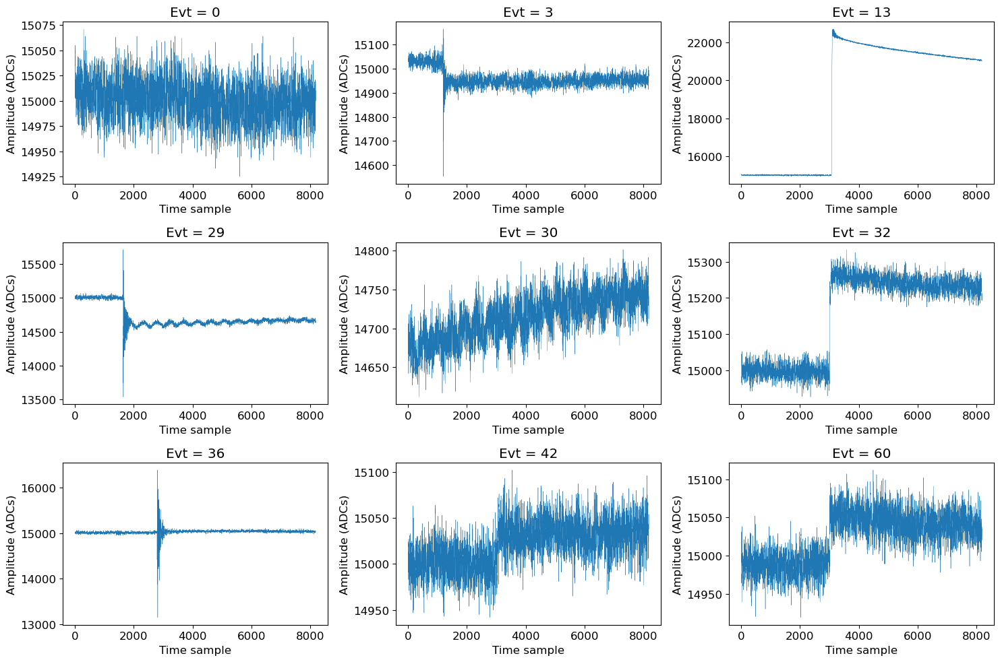

In [88]:
fig, axs = plt.subplots(3, 3, figsize=(15,10))
sel_evts = [(0, 3, 13), (29, 30, 32), (36, 42, 60)]
for i in range(3):
    for j in range(3):
        ax    = axs[i,j]
        index = sel_evts[i][j]
        wf    = data_raw.values[index]
        ax.plot(np.arange(len(wf)), wf, linewidth=0.3)
        ax.set_title(f'Evt = {index}')
        ax.set_xlabel('Time sample')
        ax.set_ylabel('Amplitude (ADCs)')

plt.tight_layout()
plt.show()

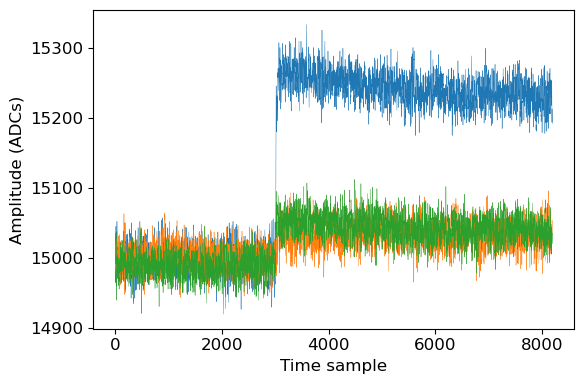

In [90]:
channel = 'ch1104000'
store   = LH5Store()
data_raw, n_tot = store.read_object(f'{channel}/raw/waveform', wf_file, n_rows=np.inf)

plt.figure(figsize=(6, 4))
for i in [32, 42, 60]:
    wf = data_raw.values[i]
    plt.plot(np.arange(len(wf)), wf, linewidth=0.3)
plt.title(f'')
plt.xlabel('Time sample')
plt.ylabel('Amplitude (ADCs)')
plt.tight_layout()
plt.show()

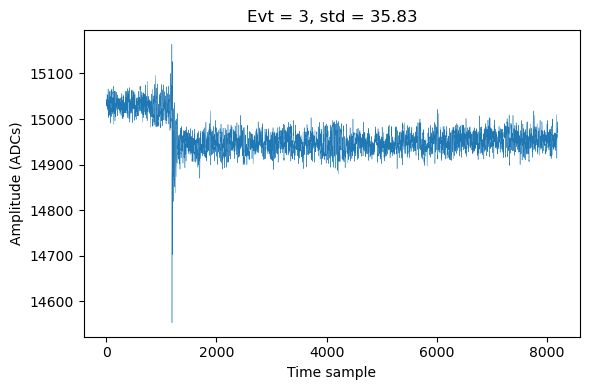

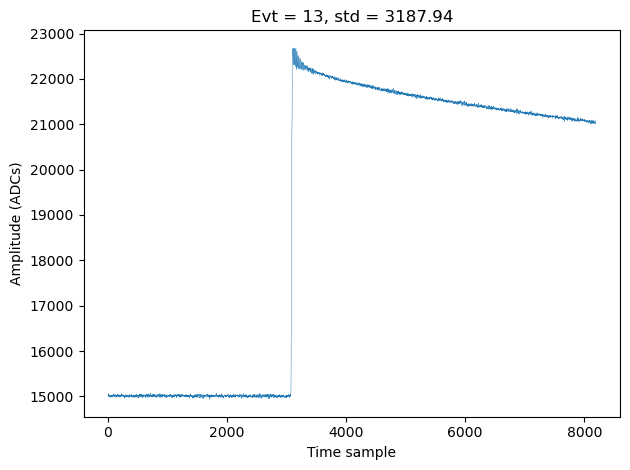

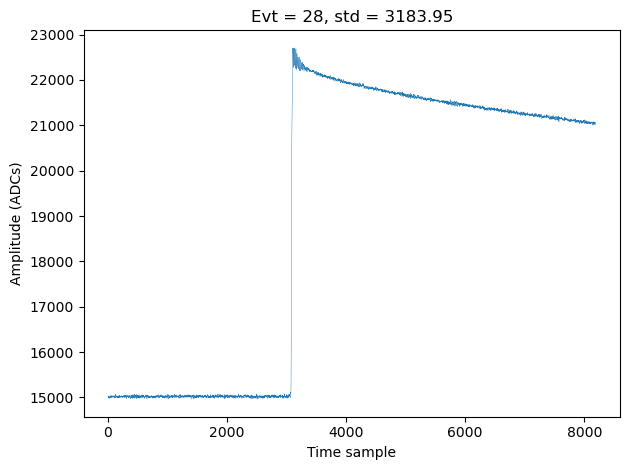

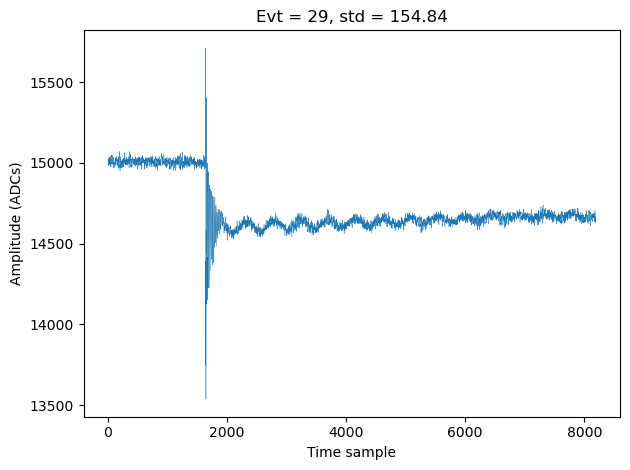

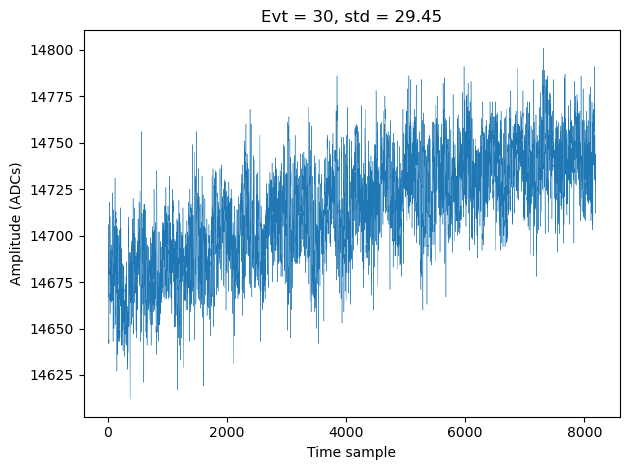

...

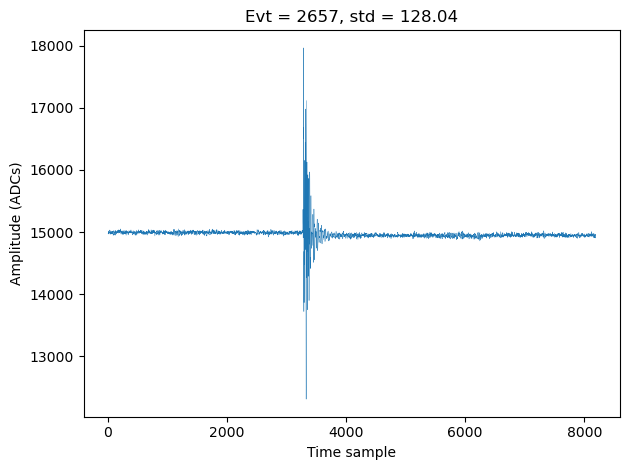

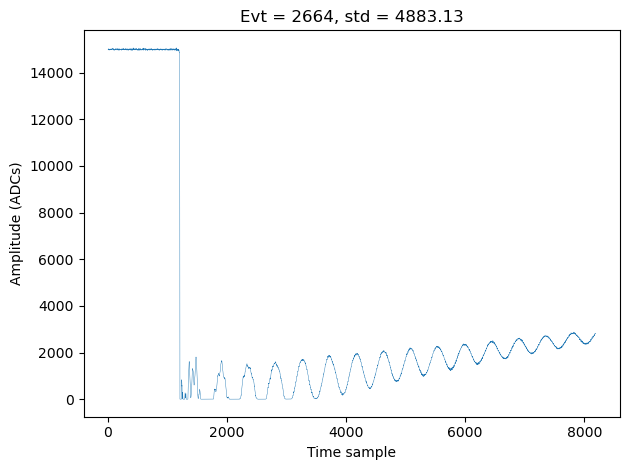

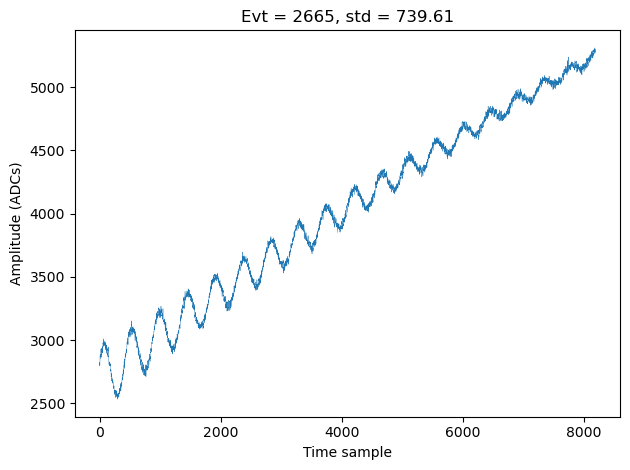

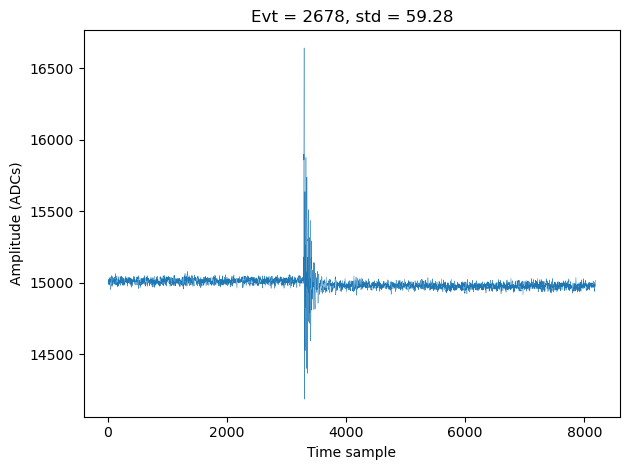

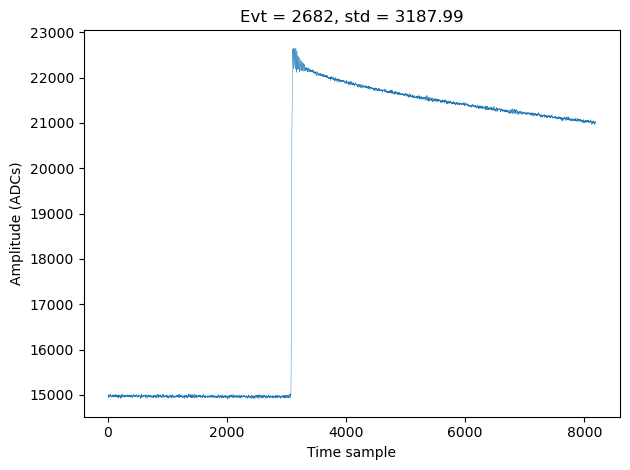

KeyboardInterrupt: 

In [23]:
channel = 'ch1104000'
store   = LH5Store()
data_raw, n_tot = store.read_object(f'{channel}/raw/waveform', wf_file, n_rows=np.inf)

plt.figure(figsize=(6, 4))
for i in range(len(data_raw.values)):
    wf = data_raw.values[i]
    if np.std(wf)>22:
        plt.plot(np.arange(len(wf)), wf, linewidth=0.3)
        plt.title(f'Evt = {i}, std = {np.round(np.std(wf), 2)}')
        plt.xlabel('Time sample')
        plt.ylabel('Amplitude (ADCs)')
        plt.tight_layout()
        plt.show()

In [15]:
channel = 'ch1104001'
store   = LH5Store() 
data_raw1, n_tot1 = store.read_object(f'{channel}/raw/waveform', wf_file, n_rows=np.inf)

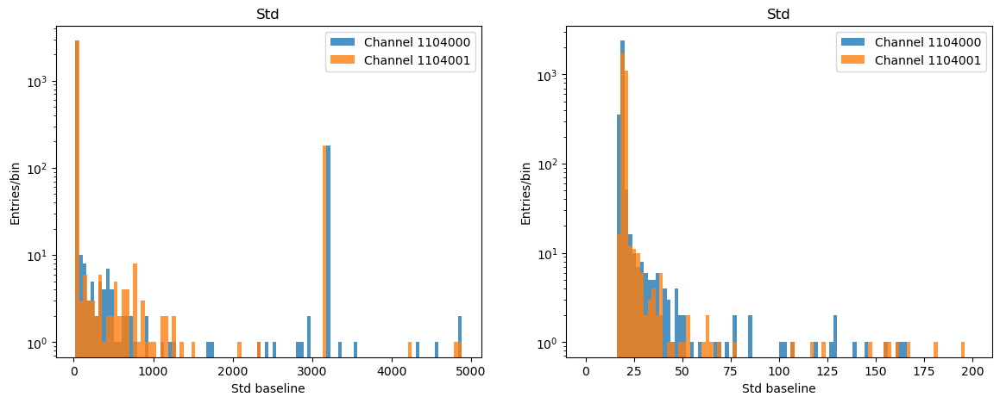

In [16]:
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(14,5))
ax0.hist([np.std(data_raw .values[i]) for i in range(len(data_raw .values))], bins=100, log=True, alpha=0.8, label='Channel 1104000')
ax0.hist([np.std(data_raw1.values[i]) for i in range(len(data_raw1.values))], bins=100, log=True, alpha=0.8, label='Channel 1104001')
ax0.set_title('Std')
ax0.set_xlabel('Std baseline')
ax0.set_ylabel('Entries/bin')
ax0.legend()
ax1.hist([np.std(data_raw .values[i]) for i in range(len(data_raw .values))], bins=100, range=(0, 200), log=True, alpha=0.8, label='Channel 1104000')
ax1.hist([np.std(data_raw1.values[i]) for i in range(len(data_raw1.values))], bins=100, range=(0, 200), log=True, alpha=0.8, label='Channel 1104001')
ax1.set_title('Std')
ax1.set_xlabel('Std baseline')
ax1.set_ylabel('Entries/bin')
ax1.legend()

## Compute the std for all the files in r008

In [26]:
files_r008_list = glob.glob(os.path.join(get_data_path(run=8, data_type='raw'), '*.lh5'))

In [66]:
channel0 = 'ch1104000'
channel1 = 'ch1104001'

all_stds0_r008 = np.array([])
all_stds1_r008 = np.array([])
for wf_file in files_r008_list:
    print(wf_file)
    store0 = LH5Store()
    store1 = LH5Store()
    data_raw0, n_tot0 = store0.read_object(f'{channel0}/raw/waveform', wf_file, n_rows=np.inf)
    data_raw1, n_tot1 = store1.read_object(f'{channel1}/raw/waveform', wf_file, n_rows=np.inf)
    stds0 = np.array([np.std(data_raw0.values[i]) for i in range(len(data_raw0.values))])
    stds1 = np.array([np.std(data_raw1.values[i]) for i in range(len(data_raw1.values))])
    all_stds0_r008 = np.concatenate((all_stds0_r008, stds0))
    all_stds1_r008 = np.concatenate((all_stds1_r008, stds1))

/pscratch/sd/r/romo/legend_data/l200/tier/raw/tst/p06/r008/l200-p06-r008-tst-20230730T031312Z.lh5
/pscratch/sd/r/romo/legend_data/l200/tier/raw/tst/p06/r008/l200-p06-r008-tst-20230729T172420Z.lh5
/pscratch/sd/r/romo/legend_data/l200/tier/raw/tst/p06/r008/l200-p06-r008-tst-20230729T152416Z.lh5
/pscratch/sd/r/romo/legend_data/l200/tier/raw/tst/p06/r008/l200-p06-r008-tst-20230729T142415Z.lh5
/pscratch/sd/r/romo/legend_data/l200/tier/raw/tst/p06/r008/l200-p06-r008-tst-20230730T071339Z.lh5
/pscratch/sd/r/romo/legend_data/l200/tier/raw/tst/p06/r008/l200-p06-r008-tst-20230730T151357Z.lh5
/pscratch/sd/r/romo/legend_data/l200/tier/raw/tst/p06/r008/l200-p06-r008-tst-20230730T051315Z.lh5
/pscratch/sd/r/romo/legend_data/l200/tier/raw/tst/p06/r008/l200-p06-r008-tst-20230729T062316Z.lh5
/pscratch/sd/r/romo/legend_data/l200/tier/raw/tst/p06/r008/l200-p06-r008-tst-20230730T091343Z.lh5
/pscratch/sd/r/romo/legend_data/l200/tier/raw/tst/p06/r008/l200-p06-r008-tst-20230730T141356Z.lh5
/pscratch/sd/r/romo/

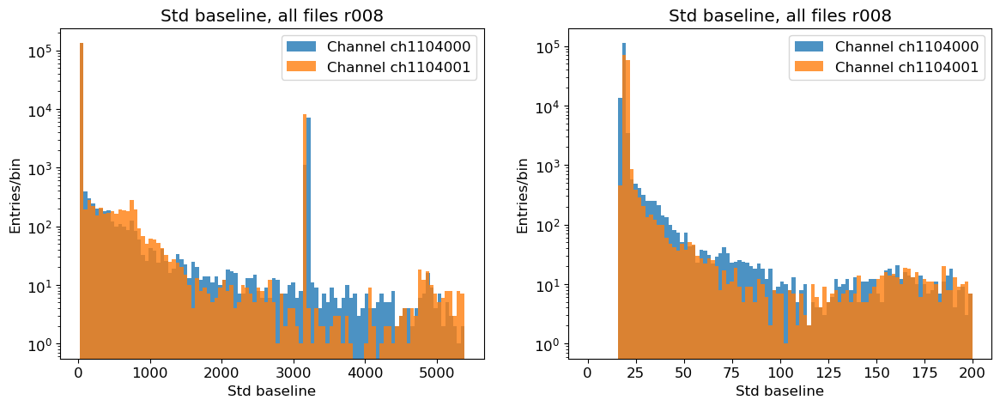

In [67]:
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(14,5))
ax0.hist(all_stds0_r008, bins=100,                 log=True, alpha=0.8, label=f'Channel {channel0}')
ax0.hist(all_stds1_r008, bins=100,                 log=True, alpha=0.8, label=f'Channel {channel1}')
ax1.hist(all_stds0_r008, bins=100, range=(0, 200), log=True, alpha=0.8, label=f'Channel {channel0}')
ax1.hist(all_stds1_r008, bins=100, range=(0, 200), log=True, alpha=0.8, label=f'Channel {channel1}')
ax0.set_title('Std baseline, all files r008' )
ax0.set_xlabel('Std baseline')
ax0.set_ylabel('Entries/bin' )
ax0.legend()
ax1.set_title('Std baseline, all files r008' )
ax1.set_xlabel('Std baseline')
ax1.set_ylabel('Entries/bin' )
ax1.legend()
plt.show()

In [68]:
## files_r005_list = glob.glob(os.path.join(get_data_path(run=5, data_type='raw'), '*Z.lh5'))
## 
## all_stds0_r005 = np.array([])
## all_stds1_r005 = np.array([])
## for wf_file in files_r005_list:
##     print(wf_file)
##     data_raw0, n_tot0 = store.read_object(f'{channel0}/raw/waveform', wf_file, n_rows=np.inf)
##     data_raw1, n_tot1 = store.read_object(f'{channel1}/raw/waveform', wf_file, n_rows=np.inf)
##     stds0 = np.array([np.std(data_raw0.values[i]) for i in range(len(data_raw0.values))])
##     stds1 = np.array([np.std(data_raw1.values[i]) for i in range(len(data_raw1.values))])
##     all_stds0_r005 = np.concatenate((all_stds0_r005, stds0))
##     all_stds1_r005 = np.concatenate((all_stds1_r005, stds1))

files_r006_list = glob.glob(os.path.join(get_data_path(run=6, data_type='raw'), '*Z.lh5'))

all_stds0_r006 = np.array([])
all_stds1_r006 = np.array([])
for wf_file in files_r006_list:
    print(wf_file)
    store0 = LH5Store()
    store1 = LH5Store()
    data_raw0, n_tot0 = store0.read_object(f'{channel0}/raw/waveform', wf_file, n_rows=np.inf)
    data_raw1, n_tot1 = store1.read_object(f'{channel1}/raw/waveform', wf_file, n_rows=np.inf)
    stds0 = np.array([np.std(data_raw0.values[i]) for i in range(len(data_raw0.values))])
    stds1 = np.array([np.std(data_raw1.values[i]) for i in range(len(data_raw1.values))])
    all_stds0_r006 = np.concatenate((all_stds0_r006, stds0))
    all_stds1_r006 = np.concatenate((all_stds1_r006, stds1))

/pscratch/sd/r/romo/legend_data/l200/tier/raw/tst/p06/r006/l200-p06-r006-tst-20230725T040904Z.lh5
/pscratch/sd/r/romo/legend_data/l200/tier/raw/tst/p06/r006/l200-p06-r006-tst-20230725T030859Z.lh5
/pscratch/sd/r/romo/legend_data/l200/tier/raw/tst/p06/r006/l200-p06-r006-tst-20230725T000853Z.lh5
/pscratch/sd/r/romo/legend_data/l200/tier/raw/tst/p06/r006/l200-p06-r006-tst-20230724T165508Z.lh5
/pscratch/sd/r/romo/legend_data/l200/tier/raw/tst/p06/r006/l200-p06-r006-tst-20230725T070910Z.lh5
/pscratch/sd/r/romo/legend_data/l200/tier/raw/tst/p06/r006/l200-p06-r006-tst-20230725T010855Z.lh5
/pscratch/sd/r/romo/legend_data/l200/tier/raw/tst/p06/r006/l200-p06-r006-tst-20230725T050906Z.lh5
/pscratch/sd/r/romo/legend_data/l200/tier/raw/tst/p06/r006/l200-p06-r006-tst-20230725T060907Z.lh5
/pscratch/sd/r/romo/legend_data/l200/tier/raw/tst/p06/r006/l200-p06-r006-tst-20230725T080911Z.lh5
/pscratch/sd/r/romo/legend_data/l200/tier/raw/tst/p06/r006/l200-p06-r006-tst-20230725T090913Z.lh5
/pscratch/sd/r/romo/

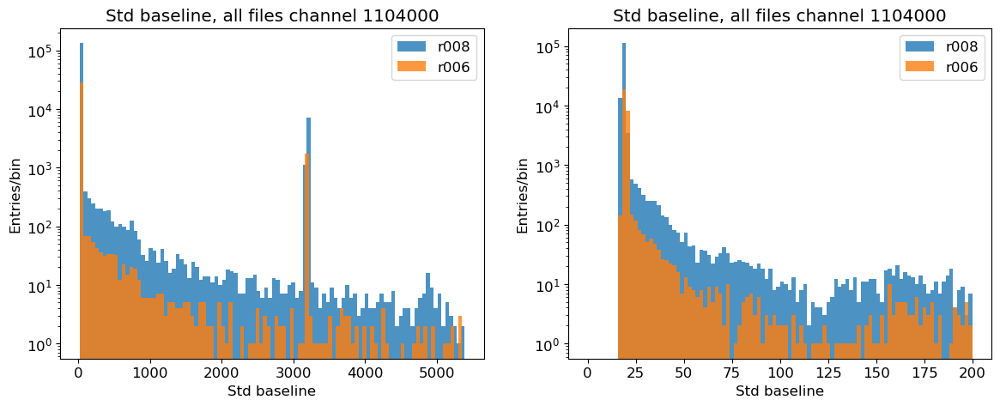

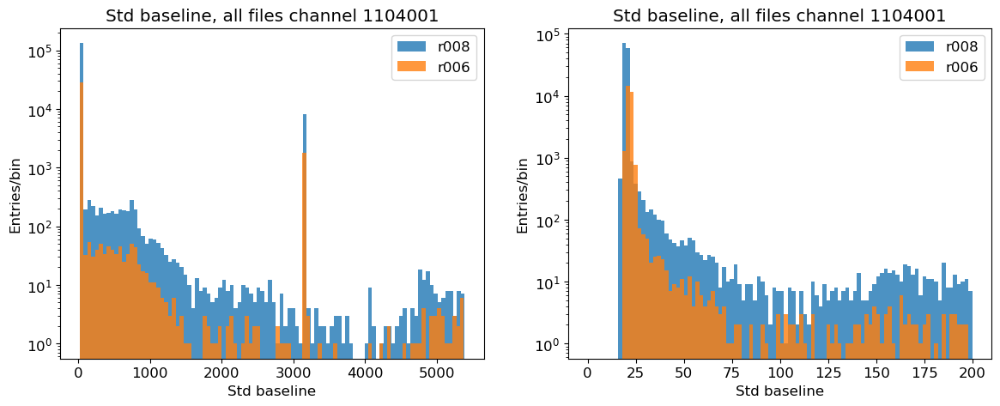

In [69]:
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(14,5))
ax0.hist(all_stds0_r008, bins=100,                 log=True, alpha=0.8, label=f'r008')
ax0.hist(all_stds0_r006, bins=100,                 log=True, alpha=0.8, label=f'r006')
ax1.hist(all_stds0_r008, bins=100, range=(0, 200), log=True, alpha=0.8, label=f'r008')
ax1.hist(all_stds0_r006, bins=100, range=(0, 200), log=True, alpha=0.8, label=f'r006')
ax0.set_title('Std baseline, all files channel 1104000' )
ax0.set_xlabel('Std baseline')
ax0.set_ylabel('Entries/bin' )
ax0.legend()
ax1.set_title('Std baseline, all files channel 1104000' )
ax1.set_xlabel('Std baseline')
ax1.set_ylabel('Entries/bin' )
ax1.legend()
plt.show()

fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(14,5))
ax0.hist(all_stds1_r008, bins=100,                 log=True, alpha=0.8, label=f'r008')
ax0.hist(all_stds1_r006, bins=100,                 log=True, alpha=0.8, label=f'r006')
ax1.hist(all_stds1_r008, bins=100, range=(0, 200), log=True, alpha=0.8, label=f'r008')
ax1.hist(all_stds1_r006, bins=100, range=(0, 200), log=True, alpha=0.8, label=f'r006')
ax0.set_title('Std baseline, all files channel 1104001' )
ax0.set_xlabel('Std baseline')
ax0.set_ylabel('Entries/bin' )
ax0.legend()
ax1.set_title('Std baseline, all files channel 1104001' )
ax1.set_xlabel('Std baseline')
ax1.set_ylabel('Entries/bin' )
ax1.legend()
plt.show()

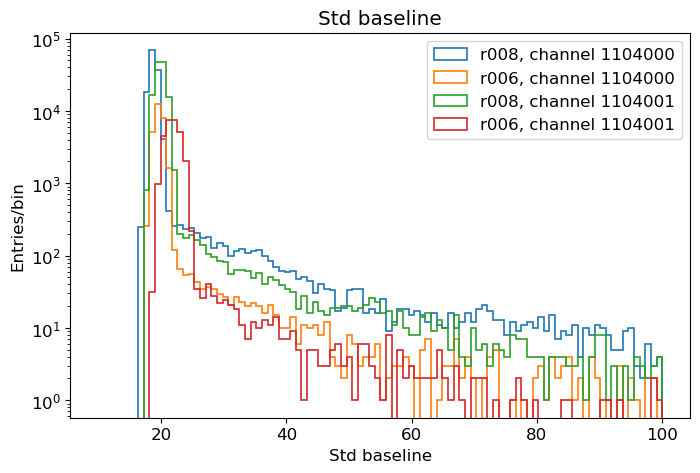

In [96]:
plt.hist(all_stds0_r008, bins=100, log=True, histtype='step', linewidth=1.2, range=(10, 100), label=f'r008, channel 1104000')
plt.hist(all_stds0_r006, bins=100, log=True, histtype='step', linewidth=1.2, range=(10, 100), label=f'r006, channel 1104000')
plt.hist(all_stds1_r008, bins=100, log=True, histtype='step', linewidth=1.2, range=(10, 100), label=f'r008, channel 1104001')
plt.hist(all_stds1_r006, bins=100, log=True, histtype='step', linewidth=1.2, range=(10, 100), label=f'r006, channel 1104001')
plt.title('Std baseline' )
plt.xlabel('Std baseline')
plt.ylabel('Entries/bin' )
plt.legend()
plt.show()

In [91]:
min(all_stds0_r008), min(all_stds0_r006), min(all_stds1_r008), min(all_stds1_r006),

(16.56751298389513, 17.23490795649869, 17.227146156094378, 18.540111512069462)

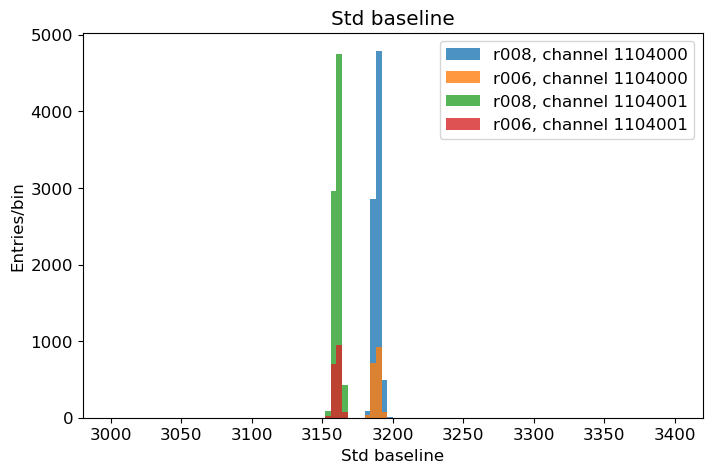

In [70]:
plt.hist(all_stds0_r008, bins=100, log=False, alpha=0.8, range=(3000, 3400), label=f'r008, channel 1104000')
plt.hist(all_stds0_r006, bins=100, log=False, alpha=0.8, range=(3000, 3400), label=f'r006, channel 1104000')
plt.hist(all_stds1_r008, bins=100, log=False, alpha=0.8, range=(3000, 3400), label=f'r008, channel 1104001')
plt.hist(all_stds1_r006, bins=100, log=False, alpha=0.8, range=(3000, 3400), label=f'r006, channel 1104001')
plt.title('Std baseline' )
plt.xlabel('Std baseline')
plt.ylabel('Entries/bin' )
plt.legend()
plt.show()

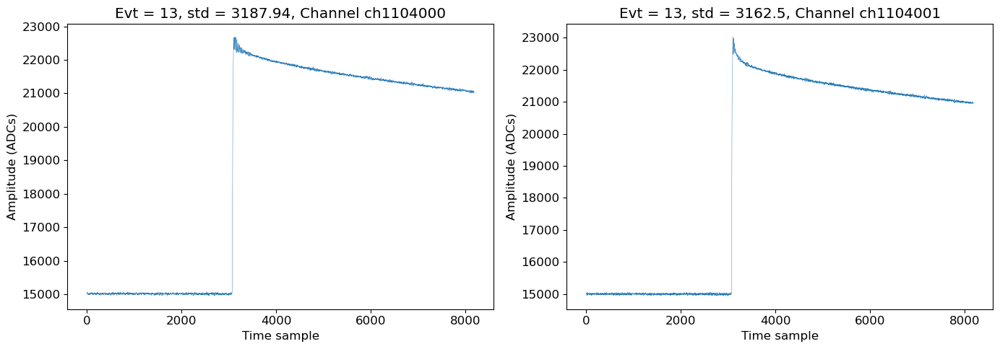

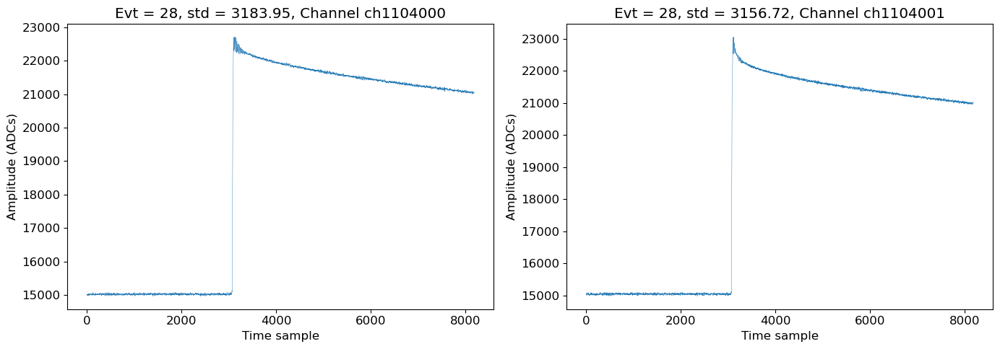

In [73]:
wf_file = get_data_path(run=8, data_type='raw') + 'l200-p06-r008-tst-20230729T052313Z.lh5'
store0  = LH5Store()
store1  = LH5Store()
data_raw0, n_tot0 = store0.read_object(f'{channel0}/raw/waveform', wf_file, n_rows=np.inf)
data_raw1, n_tot1 = store1.read_object(f'{channel1}/raw/waveform', wf_file, n_rows=np.inf)

for i in range(50):
    wf0 = data_raw0.values[i]
    wf1 = data_raw1.values[i]
    if ((np.std(wf0)>3100) and (np.std(wf0)<3200)) or ((np.std(wf1)>3100) and (np.std(wf1)<3200)):
        fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(14,5))
        ax0.plot(np.arange(len(wf0)), wf0, linewidth=0.3)
        ax1.plot(np.arange(len(wf1)), wf1, linewidth=0.3)
        ax0.set_title(f'Evt = {i}, std = {np.round(np.std(wf0), 2)}, Channel {channel0}')
        ax0.set_xlabel('Time sample')
        ax0.set_ylabel('Amplitude (ADCs)')
        ax1.set_title(f'Evt = {i}, std = {np.round(np.std(wf1), 2)}, Channel {channel1}')
        ax1.set_xlabel('Time sample')
        ax1.set_ylabel('Amplitude (ADCs)')
        plt.tight_layout()
        plt.show()

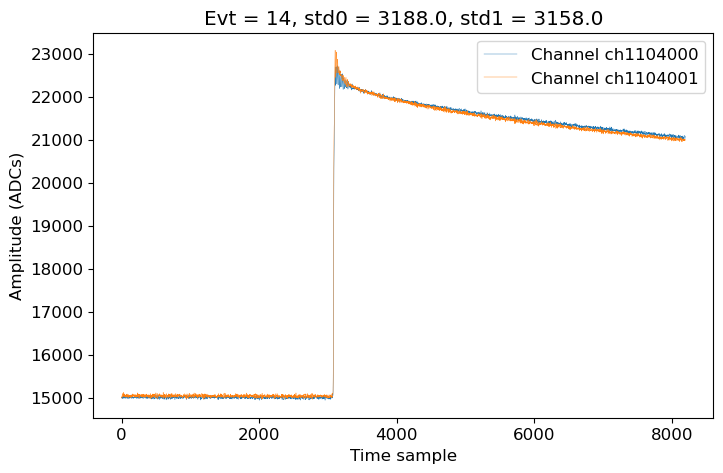

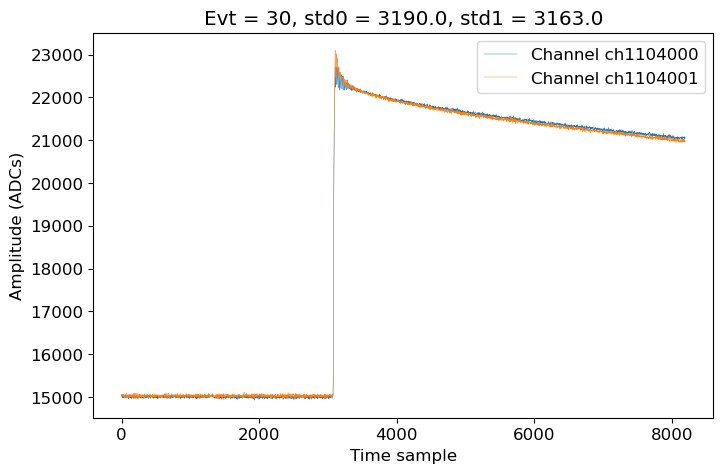

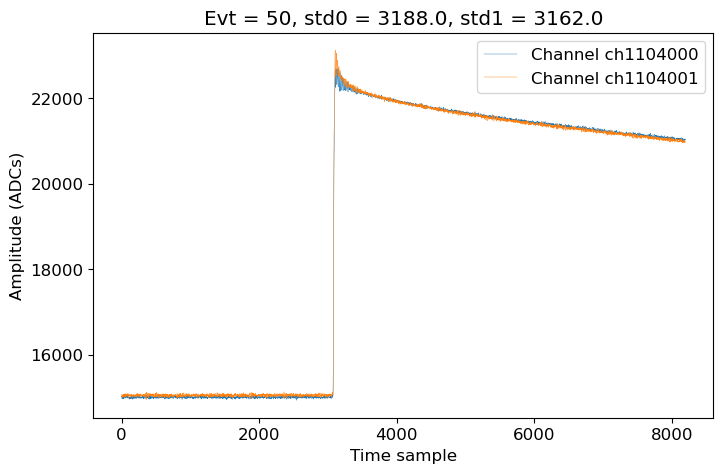

In [74]:
wf_file = get_data_path(run=6, data_type='raw') + 'l200-p06-r006-tst-20230724T165508Z.lh5'

store0 = LH5Store()
store1 = LH5Store()
data_raw0, n_tot0 = store0.read_object(f'{channel0}/raw/waveform', wf_file, n_rows=np.inf)
data_raw1, n_tot1 = store1.read_object(f'{channel1}/raw/waveform', wf_file, n_rows=np.inf)

for i in range(55):
    wf0 = data_raw0.values[i]
    wf1 = data_raw1.values[i]
    if ((np.std(wf0)>3100) and (np.std(wf0)<3200)) or ((np.std(wf1)>3100) and (np.std(wf1)<3200)):
        plt.plot(np.arange(len(wf0)), wf0, linewidth=0.3, label=f'Channel {channel0}')
        plt.plot(np.arange(len(wf1)), wf1, linewidth=0.3, label=f'Channel {channel1}')
        plt.title(f'Evt = {i}, std0 = {np.round(np.std(wf0))}, std1 = {np.round(np.std(wf1))}')
        plt.xlabel('Time sample')
        plt.ylabel('Amplitude (ADCs)')
        plt.legend()
        plt.show()

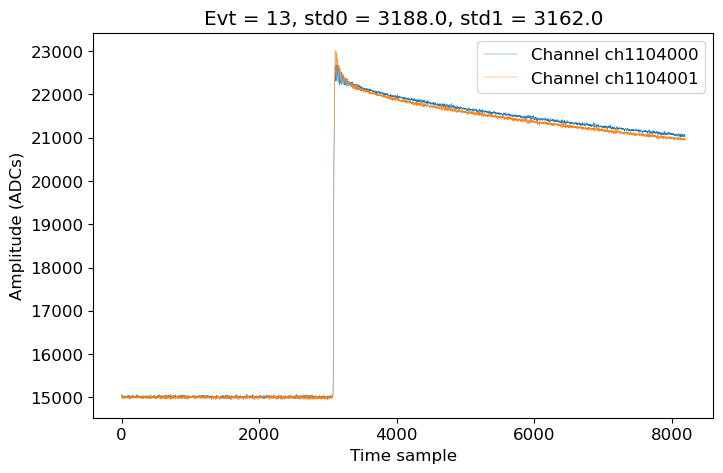

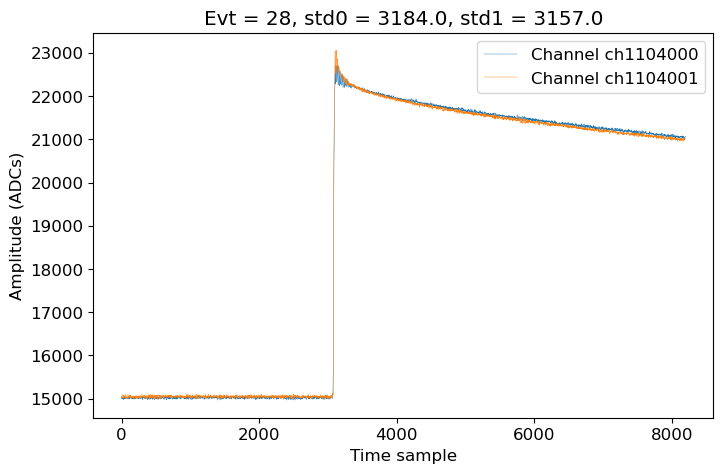

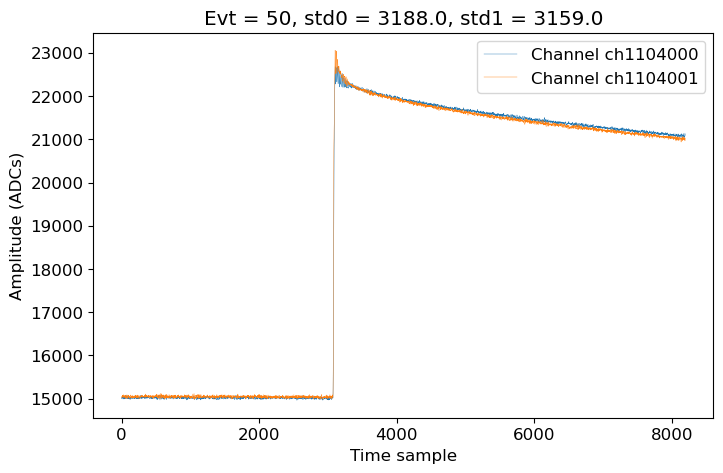

In [75]:
wf_file = get_data_path(run=8, data_type='raw') + 'l200-p06-r008-tst-20230729T052313Z.lh5'

store0 = LH5Store()
store1 = LH5Store()
data_raw0, n_tot0 = store0.read_object(f'{channel0}/raw/waveform', wf_file, n_rows=np.inf)
data_raw1, n_tot1 = store1.read_object(f'{channel1}/raw/waveform', wf_file, n_rows=np.inf)

for i in range(55):
    wf0 = data_raw0.values[i]
    wf1 = data_raw1.values[i]
    if ((np.std(wf0)>3100) and (np.std(wf0)<3200)) or ((np.std(wf1)>3100) and (np.std(wf1)<3200)):
        plt.plot(np.arange(len(wf0)), wf0, linewidth=0.3, label=f'Channel {channel0}')
        plt.plot(np.arange(len(wf1)), wf1, linewidth=0.3, label=f'Channel {channel1}')
        plt.title(f'Evt = {i}, std0 = {np.round(np.std(wf0))}, std1 = {np.round(np.std(wf1))}')
        plt.xlabel('Time sample')
        plt.ylabel('Amplitude (ADCs)')
        plt.legend()
        plt.show()

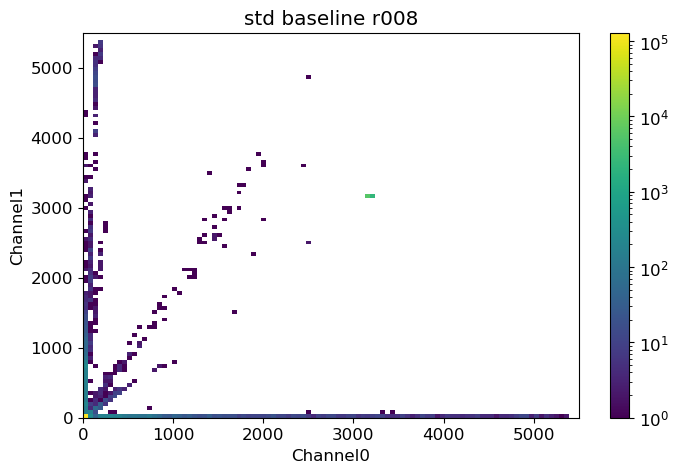

In [76]:
from matplotlib.colors import LogNorm

plt.hist2d(all_stds0_r008, all_stds1_r008, bins=(100, 100), range=((0, 5500),(0, 5500)), norm=LogNorm())
plt.colorbar()  # Add a colorbar to show the color scale
plt.xlabel('Channel0')
plt.ylabel('Channel1')
plt.title('std baseline r008')
plt.show()


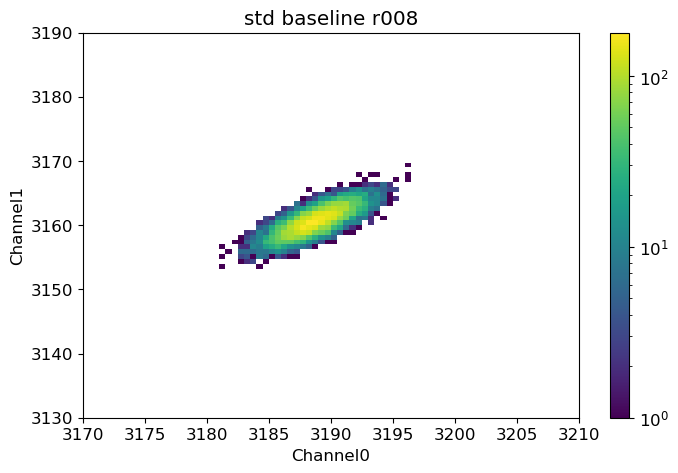

In [77]:
from matplotlib.colors import LogNorm

plt.hist2d(all_stds0_r008, all_stds1_r008, bins=(80, 80), range=((3170, 3210),(3130, 3190)), norm=LogNorm())
plt.colorbar()  # Add a colorbar to show the color scale
plt.xlabel('Channel0')
plt.ylabel('Channel1')
plt.title('std baseline r008')
plt.show()


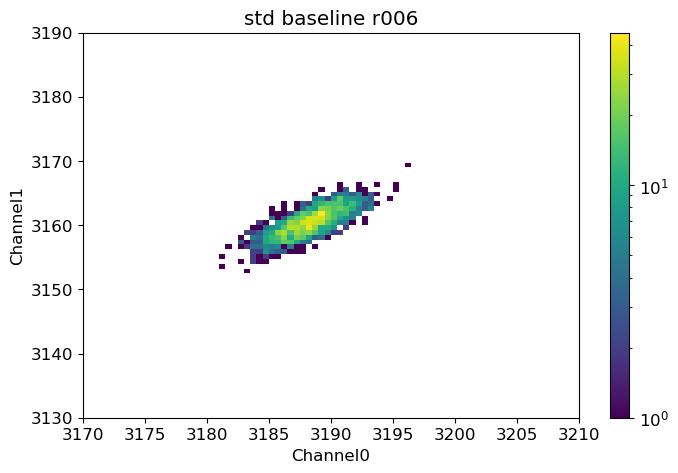

In [78]:
from matplotlib.colors import LogNorm

plt.hist2d(all_stds0_r006, all_stds1_r006, bins=(80, 80), range=((3170, 3210),(3130, 3190)), norm=LogNorm())
plt.colorbar()  # Add a colorbar to show the color scale
plt.xlabel('Channel0')
plt.ylabel('Channel1')
plt.title('std baseline r006')
plt.show()


### Make a dataframe with the info from the wfs and the energy from the dsp

In [130]:
def get_info_from_dsp(f_dsp, channel, label='dsp'):
    tb_name = f'{channel}/{label}'
    store   = LH5Store()
    data_dsp, n_tot = store.read_object(tb_name, f_dsp, n_rows=np.inf)
    return np.array(data_dsp['trap_max']), np.array(data_dsp['blmean']), np.array(data_dsp['blsigma']), np.array(data_dsp['blslope']), np.array(data_dsp['bloffset'])

def get_info_from_raw(f_raw, channel):
    store    = LH5Store()
    data_raw, n_tot = store.read_object(f'{channel}/raw/waveform', f_raw, n_rows=np.inf)
    return np.array(list(map(np.std, data_raw.values))), np.array(list(map(np.mean, data_raw.values))), np.array(list(map(np.max, data_raw.values))), np.array(list(map(np.min, data_raw.values))), np.array(list(map(calculate_baseline_slope, data_raw.values)))

from sklearn.linear_model import LinearRegression

def calculate_baseline_slope(waveform):
    x = range(len(waveform))  # Time or sample index
    x = np.array(x).reshape(-1, 1)  # Reshape for regression
    y = waveform  # Baseline waveform values

    model = LinearRegression()
    model.fit(x, y)

    baseline_slope = model.coef_[0]
    return baseline_slope

In [157]:
cal_const = namedtuple('cal_const', 'run channel')

all_cal_const = {cal_const(run=5, channel=1104000): (6.47872002988613, -2.390156533449044),
                 cal_const(run=6, channel=1104000): (6.477131358876935, 1.0614262603903626),
                 cal_const(run=8, channel=1104000): (6.479518798766513, -4.043124672109116),
                 cal_const(run=5, channel=1104001): (6.6891971468237585, -3.4191338069485937),
                 cal_const(run=6, channel=1104001): (6.689891664655627, -5.595979709461972),
                 cal_const(run=8, channel=1104001): (6.689036744259721, -4.821797502285335)}

In [160]:
df = pd.DataFrame({})
for run in [6, 8]:
    raw_files    = os.listdir(get_data_path(run=run, data_type='raw'))
    filt_files   = [file for file in raw_files if file.endswith("Z.lh5")]
    sorted_files = sorted(filt_files)
    for channel in [1104000, 1104001]:
        for data_file in sorted_files:
            print(data_file)
            wf_file  = get_data_path(run=run, data_type='raw') + data_file
            dsp_file = get_data_path(run=run, data_type='dsp') + data_file
            trap_max, blmean, blsigma, blslope, bloffset = get_info_from_dsp(dsp_file, f'ch{channel}', label='dsp')
            stds,     means,  maxs,    mins,    slopes   = get_info_from_raw(wf_file,  f'ch{channel}')
            #print(len(trap_max), len(blmean), len(blsigma), len(blslope), len(bloffset), len(stds), len(means), len(maxs), len(mins), len(slopes))
            run_number = np.full(len(trap_max), run)
            channel_id = np.full(len(trap_max), channel)
            
            slope  = all_cal_const[cal_const(run=run, channel=channel)][0]
            interc = all_cal_const[cal_const(run=run, channel=channel)][1]
            trap_max_cal = (trap_max/slope) - interc
            
            df0 = pd.DataFrame({'run'     : run_number, 'channel_id'  : channel_id,   'filename': data_file,
                                'trap_max': trap_max,   'trap_max_cal': trap_max_cal, 'blmean'  : blmean,
                                'blsigma' : blsigma,    'blslope'     : blslope,      'bloffset': bloffset,
                                'stds'    : stds,       'means'       : means,        'maxs'    : maxs, 
                                'mins'    : mins,       'slopes'      : slopes})
            df = pd.concat([df, df0])

l200-p06-r006-tst-20230724T165508Z.lh5
l200-p06-r006-tst-20230725T000853Z.lh5
l200-p06-r006-tst-20230725T010855Z.lh5
l200-p06-r006-tst-20230725T020858Z.lh5
l200-p06-r006-tst-20230725T030859Z.lh5
l200-p06-r006-tst-20230725T040904Z.lh5
l200-p06-r006-tst-20230725T050906Z.lh5
l200-p06-r006-tst-20230725T060907Z.lh5
l200-p06-r006-tst-20230725T070910Z.lh5
l200-p06-r006-tst-20230725T080911Z.lh5
l200-p06-r006-tst-20230725T090913Z.lh5
l200-p06-r006-tst-20230724T165508Z.lh5
l200-p06-r006-tst-20230725T000853Z.lh5
l200-p06-r006-tst-20230725T010855Z.lh5
l200-p06-r006-tst-20230725T020858Z.lh5
l200-p06-r006-tst-20230725T030859Z.lh5
l200-p06-r006-tst-20230725T040904Z.lh5
l200-p06-r006-tst-20230725T050906Z.lh5
l200-p06-r006-tst-20230725T060907Z.lh5
l200-p06-r006-tst-20230725T070910Z.lh5
l200-p06-r006-tst-20230725T080911Z.lh5
l200-p06-r006-tst-20230725T090913Z.lh5
l200-p06-r008-tst-20230729T052313Z.lh5
l200-p06-r008-tst-20230729T062316Z.lh5
l200-p06-r008-tst-20230729T072330Z.lh5
l200-p06-r008-tst-2023072

In [161]:
df

,run,channel_id,filename,trap_max,trap_max_cal,blmean,blsigma,blslope,bloffset,stds,means,maxs,mins,slopes
0,6,1104000,l200-p06-r006-tst-20230724T165508Z.lh5,8.910558,0.314269,14998.298605,19.453639,-0.000109,15000.432619,19.679965,14997.652344,15064,14926,0.000410
1,6,1104000,l200-p06-r006-tst-20230724T165508Z.lh5,2.993812,-0.599214,14994.390894,19.361766,-0.000130,14996.925216,19.823672,14987.648438,15061,14904,-0.001833
2,6,1104000,l200-p06-r006-tst-20230724T165508Z.lh5,5.232537,-0.253578,14993.214930,18.669609,-0.000208,14997.274776,19.640317,14988.519897,15059,14916,-0.001581
3,6,1104000,l200-p06-r006-tst-20230724T165508Z.lh5,7.329837,0.070222,15022.671042,19.869531,-0.000021,15023.083997,19.531355,15022.953735,15090,14956,-0.000500
4,6,1104000,l200-p06-r006-tst-20230724T165508Z.lh5,8.587540,0.264398,15019.917145,20.491392,-0.000213,15024.077407,20.557889,15018.044556,15090,14936,-0.000213
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76,8,1104001,l200-p06-r008-tst-20230731T101641Z.lh5,7.550350,5.950562,15042.282609,19.777498,0.000281,15036.812953,20.018814,15045.209351,15112,14946,0.000397
77,8,1104001,l200-p06-r008-tst-20230731T101641Z.lh5,4.601363,5.509694,15043.280968,19.565675,-0.000031,15043.882993,20.478872,15039.888550,15114,14960,-0.001573
78,8,1104001,l200-p06-r008-tst-20230731T101641Z.lh5,6.574175,5.804626,15029.874487,18.379193,0.000355,15022.957340,18.301217,15032.495361,15093,14964,0.000578
79,8,1104001,l200-p06-r008-tst-20230731T101641Z.lh5,6.616613,5.810970,15021.855619,21.070618,0.000023,15021.407257,21.063327,15021.372803,15098,14946,-0.000922


In [151]:
df_r6_ch0 = df[(df.run==6) & (df.channel_id==1104000)]
df_r6_ch1 = df[(df.run==6) & (df.channel_id==1104001)]
df_r8_ch0 = df[(df.run==8) & (df.channel_id==1104000)]
df_r8_ch1 = df[(df.run==8) & (df.channel_id==1104001)]

In [153]:
df_r6_ch0;

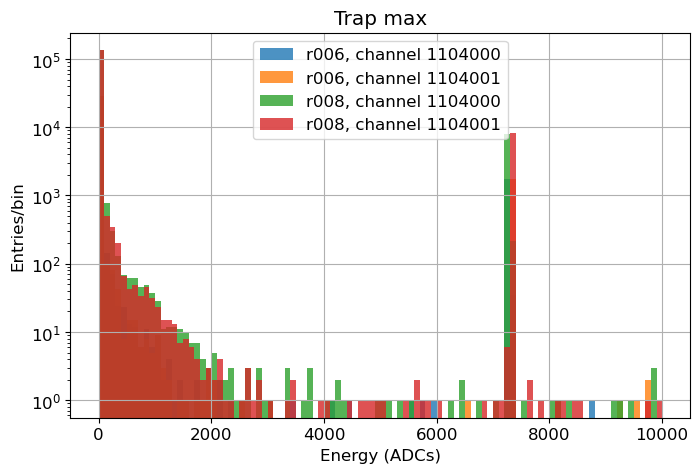

In [181]:
for run in [6, 8]:
    for channel in [1104000, 1104001]:
        df[(df.run==run) & (df.channel_id==channel)].trap_max .hist(bins=100, range=(0,10000), log=True, alpha=0.8, label=f'r00{run}, channel {channel}')
plt.title('Trap max')
plt.xlabel('Energy (ADCs)')
plt.ylabel('Entries/bin')
plt.legend();

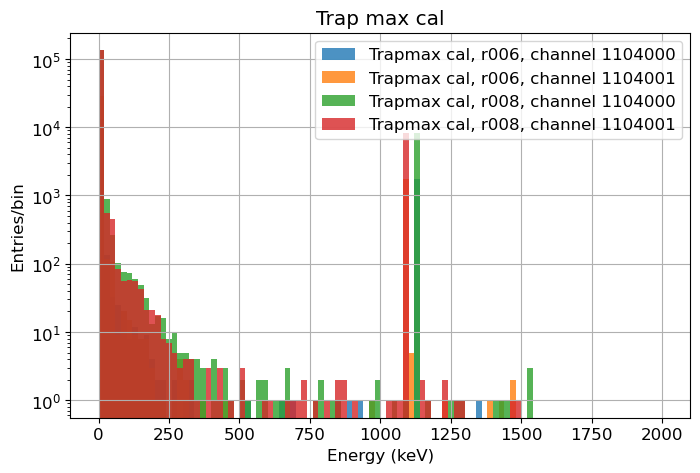

In [180]:
for run in [6, 8]:
    for channel in [1104000, 1104001]:
        df[(df.run==run) & (df.channel_id==channel)].trap_max_cal.hist(bins=100, range=(0,2000), log=True, alpha=0.8, label=f'Trapmax cal, r00{run}, channel {channel}')
plt.title('Trap max cal')
plt.xlabel('Energy (keV)')
plt.ylabel('Entries/bin')
plt.legend();

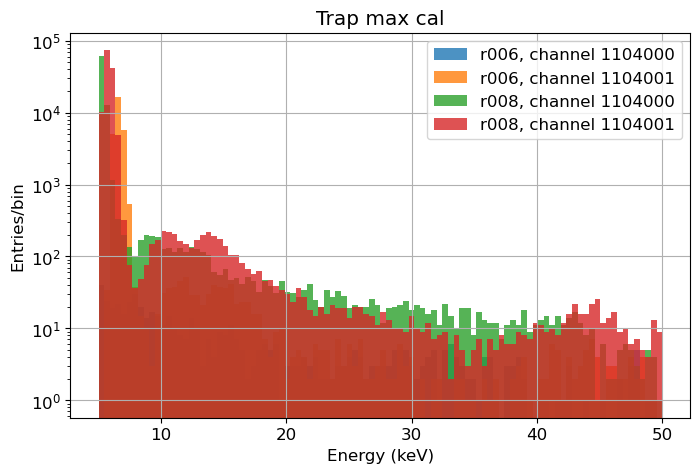

In [179]:
for run in [6, 8]:
    for channel in [1104000, 1104001]:
        df[(df.run==run) & (df.channel_id==channel)].trap_max_cal.hist(bins=100, range=(5,50), log=True, alpha=0.8, label=f'r00{run}, channel {channel}')
plt.title('Trap max cal')
plt.xlabel('Energy (keV)')
plt.ylabel('Entries/bin')
plt.legend();

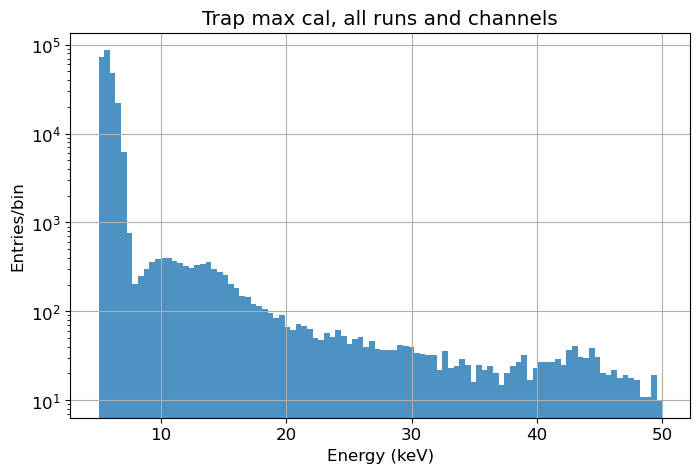

In [183]:
df.trap_max_cal.hist(bins=100, range=(5,50), log=True, alpha=0.8)
plt.title('Trap max cal, all runs and channels')
plt.xlabel('Energy (keV)')
plt.ylabel('Entries/bin')
plt.show()

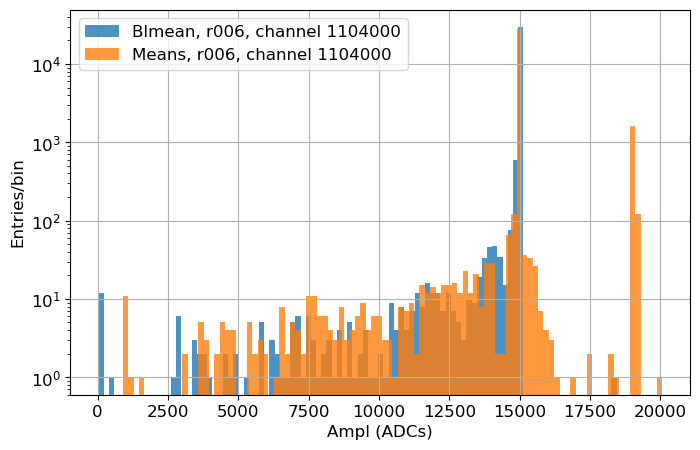

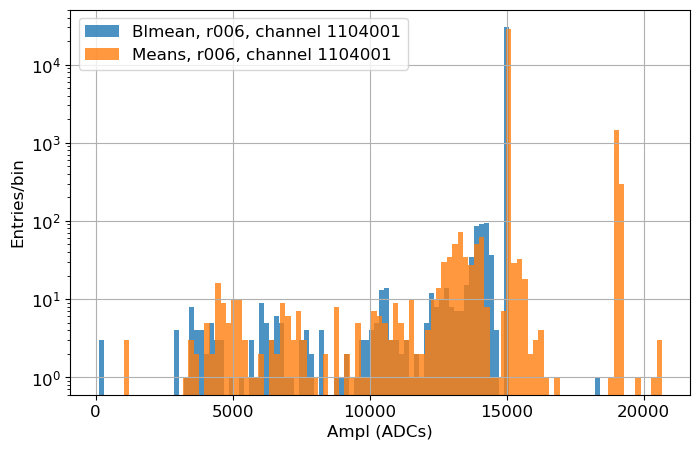

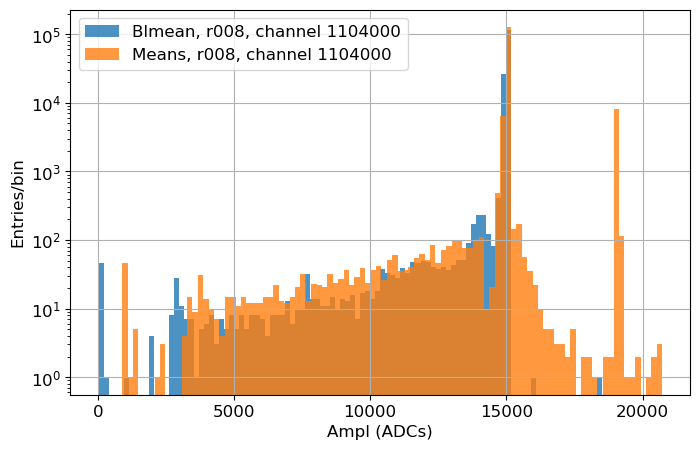

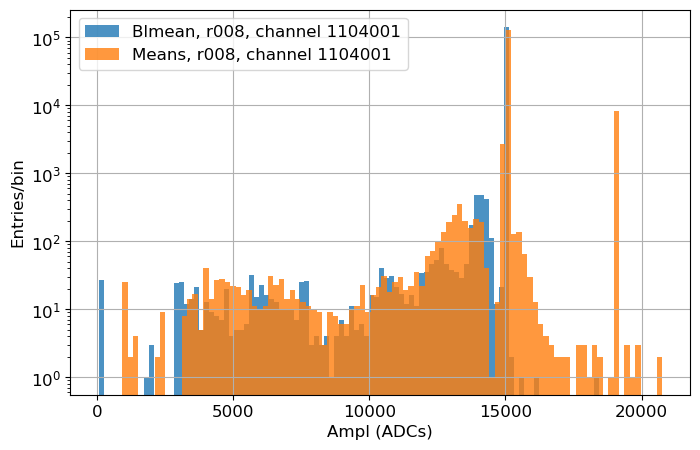

In [184]:
for run in [6, 8]:
    for channel in [1104000, 1104001]:
        df[(df.run==run) & (df.channel_id==channel)].blmean.hist(bins=100, log=True, alpha=0.8, label=f'Blmean, r00{run}, channel {channel}')
        df[(df.run==run) & (df.channel_id==channel)].means .hist(bins=100, log=True, alpha=0.8, label=f'Means, r00{run}, channel {channel}')
        plt.xlabel('Ampl (ADCs)')
        plt.ylabel('Entries/bin')
        plt.legend()
        plt.show()

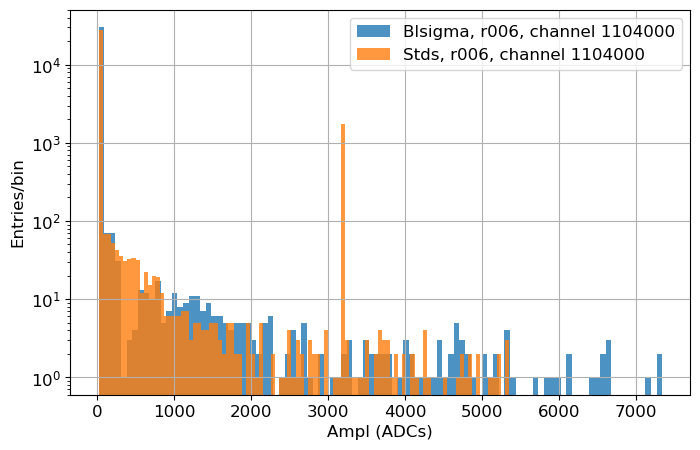

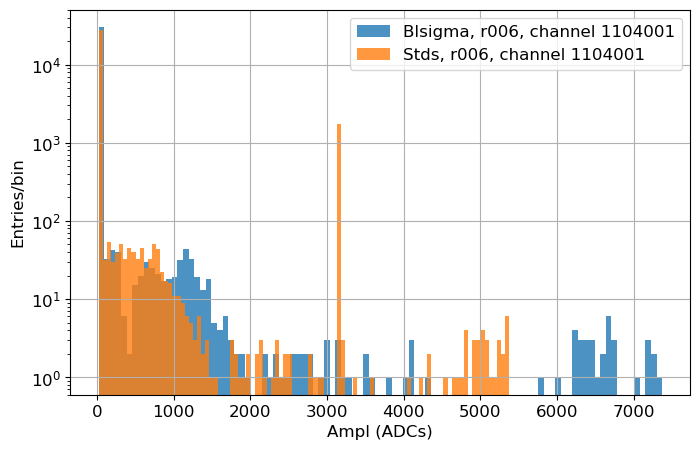

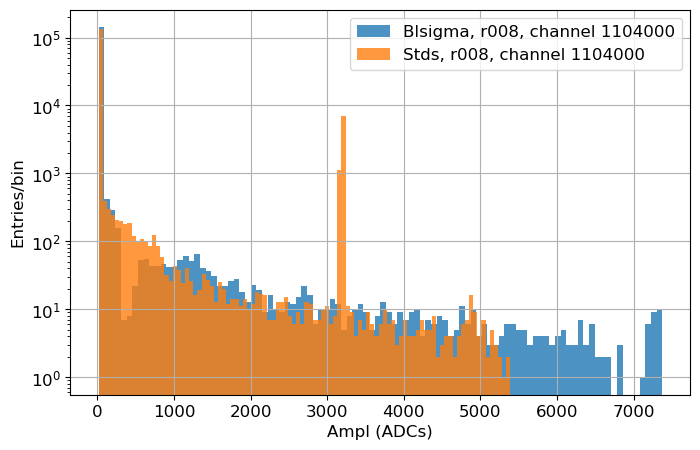

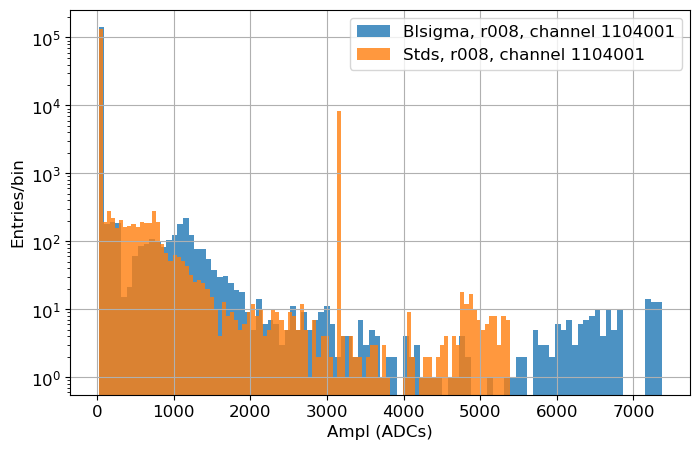

In [185]:
for run in [6, 8]:
    for channel in [1104000, 1104001]:
        df[(df.run==run) & (df.channel_id==channel)].blsigma.hist(bins=100, log=True, alpha=0.8, label=f'Blsigma, r00{run}, channel {channel}')
        df[(df.run==run) & (df.channel_id==channel)].stds   .hist(bins=100, log=True, alpha=0.8, label=f'Stds, r00{run}, channel {channel}')
        plt.xlabel('Ampl (ADCs)')
        plt.ylabel('Entries/bin')
        plt.legend()
        plt.show()

## Cuts

In [ ]:
channel = 'ch1104000'
store   = LH5Store() 
data_raw, n_tot = store.read_object(f'{channel}/raw/waveform', wf_file, n_rows=np.inf)

plt.figure(figsize=(6, 4))
for i in range(len(data_raw.values)):
    wf = data_raw.values[i]
    if np.std(wf)>22 and np.std(wf)<100:
        slope = calculate_baseline_slope(wf)
        if slope > 0:
            max_min = np.max(wf) - np.min(wf)
            if max_min < 250:
                if np.mean(wf)>14800:
                    plt.plot(np.arange(len(wf)), wf, linewidth=0.3, label=string_stats(wf))
                    plt.title(f'Evt = {i}')
                    plt.xlabel('Time sample')
                    plt.ylabel('Amplitude (ADCs)')
                    plt.legend()
                    plt.tight_layout()
                    plt.show()

In [122]:
store = LH5Store()
data_raw, n_tot = store.read_object(f'{channel}/raw/waveform', get_data_path(run=run, data_type='raw')+wf_file, n_rows=np.inf)
np.array(list(map(np.std, data_raw.values)))

array([19.67996469, 19.82367187, 19.64031659, ..., 19.8990347 ,
       20.28132154, 21.03341139])